In [1]:
from cmath import nan
import numpy as np 
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from helpers_DF import *
import matplotlib.animation as animation
from matplotlib import rcParams
from IPython.display import HTML
rcParams['animation.embed_limit'] = 60
from matplotlib import colors as mcolors
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import plotly.graph_objects as go
import os


In [83]:
directory_path = "sim_data"
# List all the .npy files in the directory
all_files = [f for f in os.listdir(directory_path) if f.endswith('.npy')]

# Sort the files based on the starting step (this assumes the naming convention you've used)
sorted_files = sorted(all_files, key=lambda x: int(x.split('_')[2]))

# List to store data from each file
data_list = []

# Loop through each sorted file, load the data, and add it to the list
for filename in sorted_files:
    full_path = os.path.join(directory_path, filename)
    data = np.load(full_path, allow_pickle=True)
    data_list.append(data)

# Convert the list of arrays into a numpy array of arrays
all_data = np.array(data_list, dtype=object)

data_save = np.concatenate(all_data)


In [87]:
np.shape(data_save[-1][:,-1])

(500,)

In [92]:
for i in range(500):
    print(np.max(data_save[i][:,-1]))

0.0
0.05835099785259301
0.05997620306091356
0.05993417199228379
0.011950162744976733
0.054114195895586525
0.054084132340178726
0.02860227752044886
0.05281363025532693
0.052785963497922084
0.011613855795991057
0.0034759607693549688
0.0028191022843685465
0.0042667077508649065
0.054984819875181
0.05495294482443491
0.04475489884817363
0.010978400891334283
0.051065693151791325
0.05104135862184933
0.04797416515761532
0.04795541737613396
0.045229747538476306
0.04521584136454271
0.011019714114949175
0.003517803446580814
0.0562703132327228
0.05623589439076504
0.011802925236533923
0.003455432543942205
0.001964841683551377
0.00148407969837272
0.0012595506064418949
0.052380488442724804
0.054114195895586525
0.054084132340178614
0.011691316205392543
0.003468619280664109
0.0019766897837971698
0.05194482212370077
0.05191884564921545
0.04839874382965215
0.057523056997381694
0.05748614340274549
0.011859715631545087
0.003822693963384527
0.003819742035344964
0.0014792769268172634
0.05150651936815831
0.051

In [79]:
species=data_save[-1][:,1]

##### Plot the last step of the 2D animation

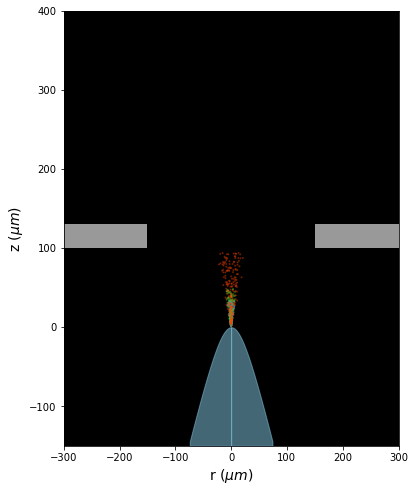

In [89]:
labels = ["Neutral", "Monomer", "Dimer", "Trimer"]
color_names = ["white", "orangered", "limegreen","royalblue"]
alphas=[0.2,0.3,0.3,0.8]
# Convert color names to RGBA format with specified alpha values
col_list = [mcolors.to_rgba(color_names[int(i)], alpha=alphas[int(i)]) for i in species[:-1]]


fig = plt.figure(figsize=(6,8), facecolor='white')
ax = fig.add_subplot(111, facecolor='black')
#fig, ax = plt.subplots()

# Plot the extractor grid
p1 = (150, 100)
p2 = (150, 130)
p3 = (300, 100)
p4 = (300, 130)
width = p3[0]-p1[0]
height = p2[1]-p1[1]
rect1 = mpatches.Rectangle((p1[0],p1[1]), width, height, facecolor ='silver', alpha=0.8)
p1 = (-150, 100)
p2 = (-150, 130)
p3 = (-300, 100)
p4 = (-300, 130)
width = p3[0]-p1[0]
height = p2[1]-p1[1]
rect2 = mpatches.Rectangle((p1[0],p1[1]), width, height, facecolor ='silver', alpha=0.8)


#Plot the tip of the emitter
r_tip=np.arange(0,75,1)
d=100
Rc=11
eta0=np.power(1+Rc/d,-1/2)
a=2*d*np.sqrt(1+Rc/d)
z_tip=100-eta0*np.sqrt(np.power(a,2)/4+np.power(r_tip,2)/(1-np.power(eta0,2)))
l, = ax.plot([],[])
#xmax=np.nanmax(pos_save[:,0,-1])*1e6

ax.clear()
ax.axis([-300,300,-150,400])
final_pos = data_save[-1]
xx = final_pos[:,2]*1e6
zz = final_pos[:,4]*1e6
#xx = pos_save[:,0,-1]*1e6
#zz = pos_save[:,2,-1]*1e6
subset_length = len(species) - 1
xx_subset = xx[:subset_length]
zz_subset = zz[:subset_length]
ax.scatter(xx_subset, zz_subset, s=5, c=col_list,marker='.')
ax.add_patch(rect1)
ax.add_patch(rect2)
plt.fill_between(r_tip+0.1, z_tip,-150, color='skyblue', alpha=0.5)
plt.fill_between(-r_tip-0.1, z_tip,-150, color='skyblue', alpha=0.5)
plt.xlabel("r ($\mu m$)",fontsize=14)
plt.ylabel("z ($\mu m$)",fontsize=14)





# Create scatter plot legend by plotting empty lists with the desired marker colors and labels
for col, label in zip(color_names[1:], labels[1:]):
    plt.scatter([], [], color=mcolors.to_rgba(col,alpha=1), s=50, label=label)

# Display the legend
#plt.legend(loc='best')
plt.savefig('2D.svg', dpi=1000)

___

## Animation

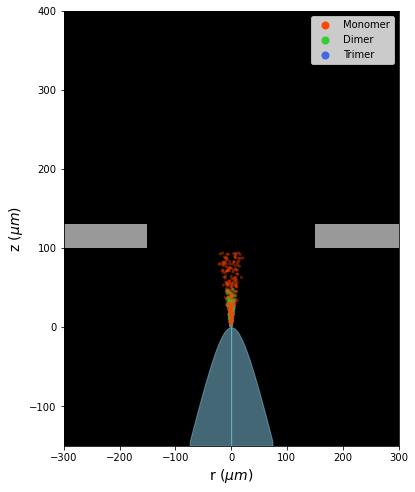

In [82]:
N=np.shape(data_save)[0]
labels = ["Neutral", "Monomer", "Dimer", "Trimer"]
color_names = ["white", "orangered", "limegreen","royalblue"]
alphas=[0.2,0.3,0.3,0.8]
# Convert color names to RGBA format with specified alpha values
col_list = [mcolors.to_rgba(color_names[int(i)], alpha=alphas[int(i)]) for i in species[:-1]]


fig = plt.figure(figsize=(6,8), facecolor='white')
ax = fig.add_subplot(111, facecolor='black')
#fig, ax = plt.subplots()

# Plot the extractor grid
p1 = (150, 100)
p2 = (150, 130)
p3 = (300, 100)
p4 = (300, 130)
width = p3[0]-p1[0]
height = p2[1]-p1[1]
rect1 = mpatches.Rectangle((p1[0],p1[1]), width, height, facecolor ='silver', alpha=0.8)
p1 = (-150, 100)
p2 = (-150, 130)
p3 = (-300, 100)
p4 = (-300, 130)
width = p3[0]-p1[0]
height = p2[1]-p1[1]
rect2 = mpatches.Rectangle((p1[0],p1[1]), width, height, facecolor ='silver', alpha=0.8)


#Plot the tip of the emitter
r_tip=np.arange(0,75,1)
d=100
Rc=11
eta0=np.power(1+Rc/d,-1/2)
a=2*d*np.sqrt(1+Rc/d)
z_tip=100-eta0*np.sqrt(np.power(a,2)/4+np.power(r_tip,2)/(1-np.power(eta0,2)))
l, = ax.plot([],[])
#xmax=np.nanmax(pos_save[:,0,-1])*1e6


# Create scatter plot legend by plotting empty lists with the desired marker colors and labels


# Display the legend


def animate(i):
    ax.clear()
    ax.axis([-300,300,-150,400])
    #current_pos = pos_save[i]
    #xx = current_pos[:,0]*1e6
    #zz = current_pos[:,2]*1e6
    
    xx=data_save[i][:i,2]*1e6
    zz=data_save[i][:i,4]*1e6
    #xx = pos_save[:i,0,i]*1e6
    #yy = pos_save[:i,1,i]
    #zz = pos_save[:i,2,i]*1e6
    ax.scatter(xx, zz,s=5,c=col_list[:i])
    ax.add_patch(rect1)
    ax.add_patch(rect2)
    plt.fill_between(r_tip+0.1, z_tip,-150, color='skyblue', alpha=0.5)
    plt.fill_between(-r_tip-0.1, z_tip,-150, color='skyblue', alpha=0.5)
    plt.xlabel("r ($\mu m$)",fontsize=14)
    plt.ylabel("z ($\mu m$)",fontsize=14)
    for col, label in zip(color_names[1:], labels[1:]):
        plt.scatter([], [], color=mcolors.to_rgba(col,alpha=1), s=50, label=label)
    plt.legend(loc='best')
    
    
    


anim2D = animation.FuncAnimation(fig, animate,frames=N)


HTML(anim2D.to_jshtml())


